<a href="https://colab.research.google.com/github/Bhuvana908/Diabetic-Retinopathy-using-AI-ML-Summer-Research-Internship-NITC-/blob/main/DR7/DR7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle scikit-image seaborn joblib tqdm albumentations grad-cam
!pip install -q torch-geometric
!pip install -q brisque
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
print("✅ Kaggle configured")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 45.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 64.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.5/155.5 kB 10.6 MB/s eta 0:00:00


Saving kaggle.json to kaggle.json
✅ Kaggle configured


In [ ]:
import os
DOWNLOAD_DIR = "/content/aptos"
os.makedirs(DOWNLOAD_DIR, exist_ok=True)

!kaggle datasets download \
    -d mariaherrerot/aptos2019 \
    -p {DOWNLOAD_DIR}

!ls -lh /content/aptos
!unzip -q /content/aptos/aptos2019.zip -d /content/aptos
print("✅ Dataset extracted")

for root, dirs, files_list in os.walk("/content/aptos"):
    print(root)
    print("Folders:", dirs[:3])
    print("Files:", files_list[:3])
    print("-"*40)

Dataset URL: https://www.kaggle.com/datasets/mariaherrerot/aptos2019
License(s): unknown
100% 8.01G/8.01G [01:15<00:00, 114MB/s] 

total 8.1G
-rw-r--r-- 1 root root 8.1G Nov 17  2021 aptos2019.zip
✅ Dataset extracted
/content/aptos
Folders: ['test_images', 'val_images', 'train_images']
Files: ['test.csv', 'aptos2019.zip', 'train_1.csv']
----------------------------------------
/content/aptos/test_images
Folders: ['test_images']
Files: []
----------------------------------------
/content/aptos/test_images/test_images
Folders: []
Files: ['ee1ec90b980f.png', 'f09cfc6a4dbd.png', 'e599151ca14b.png']
----------------------------------------
/content/aptos/val_images
Folders: ['val_images']
Files: []
----------------------------------------
/content/aptos/val_images/val_images
Folders: []
Files: ['0b64a0a06f9a.png', '032d7b0b4bf6.png', '11b220a397b8.png']
----------------------------------------
/content/aptos/train_images
Folders: ['train_images']
Files: []
----------------------------------

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch_geometric
from pathlib import Path
from tqdm import tqdm

from skimage.segmentation import slic, mark_boundaries
from skimage.util import img_as_float
from skimage.color import rgb2lab
from skimage import measure
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

from torch_geometric.data import Data
from torch_geometric.nn import GATConv
from skimage.feature import local_binary_pattern

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"✅ Libraries imported")
print(f"✅ PyTorch     : {torch.__version__}")
print(f"✅ PyG         : {torch_geometric.__version__}")
print(f"✅ CUDA        : {torch.cuda.is_available()}")
print(f"✅ Device      : {DEVICE}")

✅ Libraries imported
✅ PyTorch     : 2.11.0+cpu
✅ PyG         : 2.7.0
✅ CUDA        : False
✅ Device      : cpu


In [ ]:
from pathlib import Path

DATA_DIR  = Path("/content/aptos")
TRAIN_CSV = DATA_DIR / "train_1.csv"
IMG_DIR   = DATA_DIR / "train_images/train_images"

GRADE_LABELS = {
    0: "No DR",
    1: "Mild",
    2: "Moderate",
    3: "Severe",
    4: "Proliferative DR",
}

df = pd.read_csv(TRAIN_CSV)
df["img_path"]   = df["id_code"].apply(lambda x: str(IMG_DIR / f"{x}.png"))
df["exists"]     = df["img_path"].apply(os.path.isfile)
df["grade_name"] = df["diagnosis"].map(GRADE_LABELS)
df = df[df["exists"]].reset_index(drop=True)

print(f"✅ Total valid images: {len(df)}")
print(df["grade_name"].value_counts())
df.head()

✅ Total valid images: 2930
grade_name
No DR               1434
Moderate             808
Mild                 300
Proliferative DR     234
Severe               154
Name: count, dtype: int64


,id_code,diagnosis,img_path,exists,grade_name
0,1ae8c165fd53,2,/content/aptos/train_images/train_images/1ae8c...,True,Moderate
1,1b329a127307,1,/content/aptos/train_images/train_images/1b329...,True,Mild
2,1b32e1d775ea,4,/content/aptos/train_images/train_images/1b32e...,True,Proliferative DR
3,1b3647865779,0,/content/aptos/train_images/train_images/1b364...,True,No DR
4,1b398c0494d1,0,/content/aptos/train_images/train_images/1b398...,True,No DR


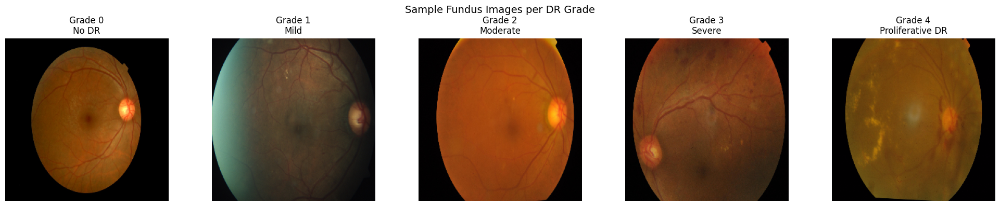

In [ ]:
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for grade in range(5):
    row = df[df["diagnosis"] == grade].iloc[0]
    img = cv2.cvtColor(cv2.imread(row["img_path"]), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))
    axes[grade].imshow(img)
    axes[grade].set_title(f"Grade {grade}\n{GRADE_LABELS[grade]}")
    axes[grade].axis("off")
plt.suptitle("Sample Fundus Images per DR Grade", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# ── Hyperparameters (paper-aligned) ──────────────────────────────────────────
IMG_SIZE     = 512    # resize target

# SLIC superpixel settings
N_SEGMENTS   = 150    # number of superpixels per image
COMPACTNESS  = 15     # shape regularity (higher = more square)
SIGMA        = 1      # pre-smoothing before SLIC

# Graph settings
K_NEIGHBOURS = 8      # k-NN edges per node

# GAT model settings
HIDDEN_DIM   = 128
# AFTER:
NUM_LAYERS   = 2      # shallower — 135-node graphs don't need depth 3
NUM_HEADS    = 4
DROPOUT      = 0.5   # slightly more dropout to fight overfitting

# Training
EPOCHS       = 80
LR           = 5e-4

print("✅ Config ready")
print(f"   IMG_SIZE={IMG_SIZE}, N_SEGMENTS={N_SEGMENTS}, K={K_NEIGHBOURS}")
print(f"   Hidden={HIDDEN_DIM}, Layers={NUM_LAYERS}, Heads={NUM_HEADS}")

✅ Config ready
   IMG_SIZE=512, N_SEGMENTS=150, K=8
   Hidden=128, Layers=2, Heads=4


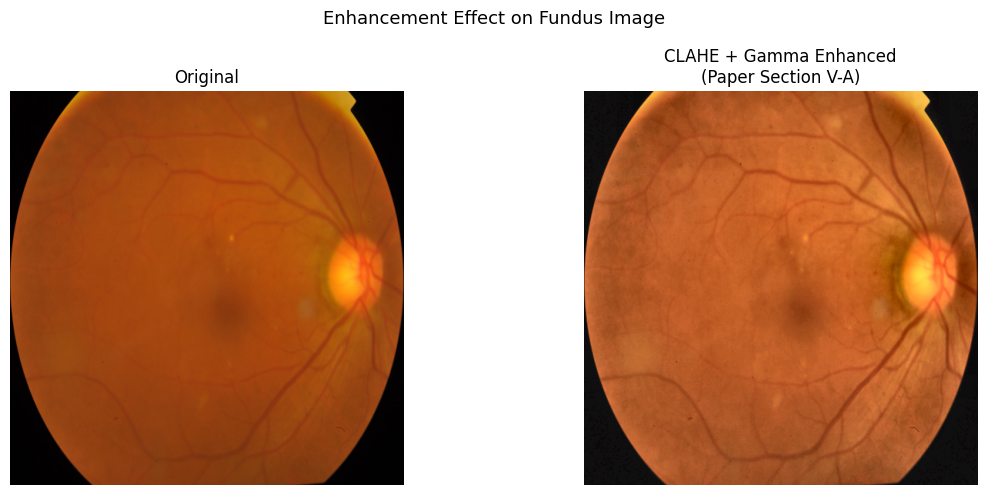

✅ Enhancement function ready


In [ ]:
def enhance_fundus_clahe(image_rgb, clip_limit=2.0, tile_grid=(8, 8), gamma=1.2):
    """
    Paper Section V-A:
      1. CLAHE on L channel of LAB  → local contrast boost
      2. Gamma correction           → recover brightness lost by CLAHE
    Returns enhanced RGB image.
    """
    # Convert to LAB to apply CLAHE only on the lightness channel
    lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)
    L, A, B = cv2.split(lab)

    # Step 1: CLAHE on L channel (paper: "Contrast-Limited Adaptive Histogram Equalization")
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid)
    L_clahe = clahe.apply(L)

    # Step 2: Gamma correction (paper: "compensate for brightness loss from CLAHE")
    L_float   = L_clahe.astype(np.float32) / 255.0
    L_gamma   = np.power(L_float, 1.0 / gamma)
    L_out     = (L_gamma * 255).clip(0, 255).astype(np.uint8)

    # Merge back
    lab_out   = cv2.merge([L_out, A, B])
    enhanced  = cv2.cvtColor(lab_out, cv2.COLOR_LAB2RGB)
    return enhanced


def load_and_enhance(image_path, target_size=512):
    """
    Full preprocessing:
      1. Load + crop black border
      2. Resize
      3. CLAHE + gamma (paper method)
    Returns (enhanced_rgb, original_rgb)
    """
    img_bgr = cv2.imread(str(image_path))
    image   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Crop black border (retinal images have large black margins)
    try:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        _, mask = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
        coords   = cv2.findNonZero(mask)
        x, y, w, h = cv2.boundingRect(coords)
        image    = image[y:y+h, x:x+w]
    except Exception:
        pass

    image   = cv2.resize(image, (target_size, target_size), interpolation=cv2.INTER_AREA)
    enhanced = enhance_fundus_clahe(image)
    return enhanced, image


# ── Demo: show enhancement effect ────────────────────────────────────────────
sample_path = df[df["diagnosis"] == 2].iloc[0]["img_path"]
enhanced_demo, original_demo = load_and_enhance(sample_path)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(original_demo);  axes[0].set_title("Original");               axes[0].axis("off")
axes[1].imshow(enhanced_demo);  axes[1].set_title("CLAHE + Gamma Enhanced\n(Paper Section V-A)"); axes[1].axis("off")
plt.suptitle("Enhancement Effect on Fundus Image", fontsize=13)
plt.tight_layout(); plt.show()
print("✅ Enhancement function ready")

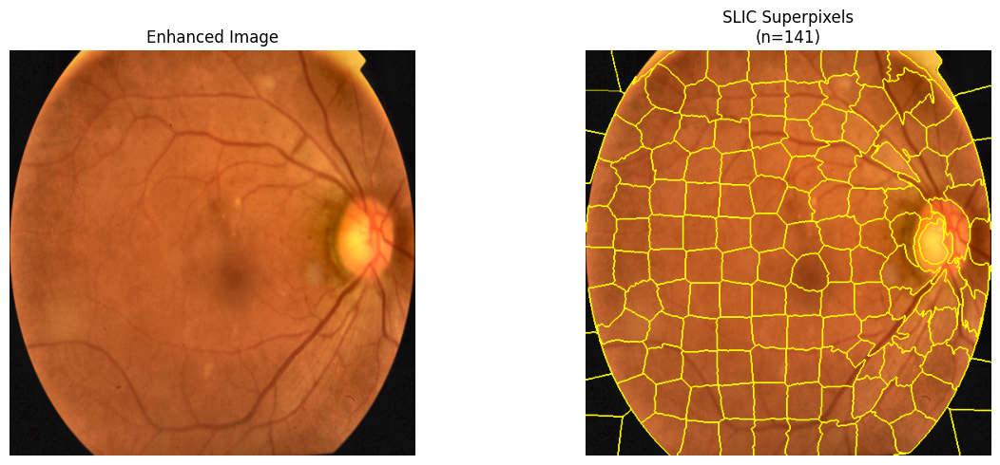

✅ Superpixels: 141


In [ ]:
def generate_superpixels(image_rgb, n_segments=150, compactness=15, sigma=1):
    """
    Paper Section V / Related Work (Boulaabi et al.):
      SLIC in LAB color space so superpixel boundaries respect
      perceptual color differences — lesions (which differ in hue
      from normal retina) get their own superpixels.
    Returns:
      segments : (H, W) int array, superpixel IDs
      n_sp     : actual number of superpixels
    """
    img_lab  = rgb2lab(image_rgb.astype(np.float32) / 255.0)
    segments = slic(
        img_lab,
        n_segments  = n_segments,
        compactness = compactness,
        sigma       = sigma,
        start_label = 0,
        channel_axis= -1
    )
    n_sp = int(segments.max() + 1)
    return segments, n_sp


# ── Demo: show superpixel boundaries ─────────────────────────────────────────
segs_demo, n_sp_demo = generate_superpixels(enhanced_demo, N_SEGMENTS, COMPACTNESS)
boundaries = mark_boundaries(enhanced_demo.astype(np.float32) / 255.0, segs_demo)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].imshow(enhanced_demo);  axes[0].set_title("Enhanced Image");     axes[0].axis("off")
axes[1].imshow(boundaries);     axes[1].set_title(f"SLIC Superpixels\n(n={n_sp_demo})"); axes[1].axis("off")
plt.tight_layout(); plt.show()
print(f"✅ Superpixels: {n_sp_demo}")

=== Vessel-Suppressed Anomaly Maps — All Grades ===



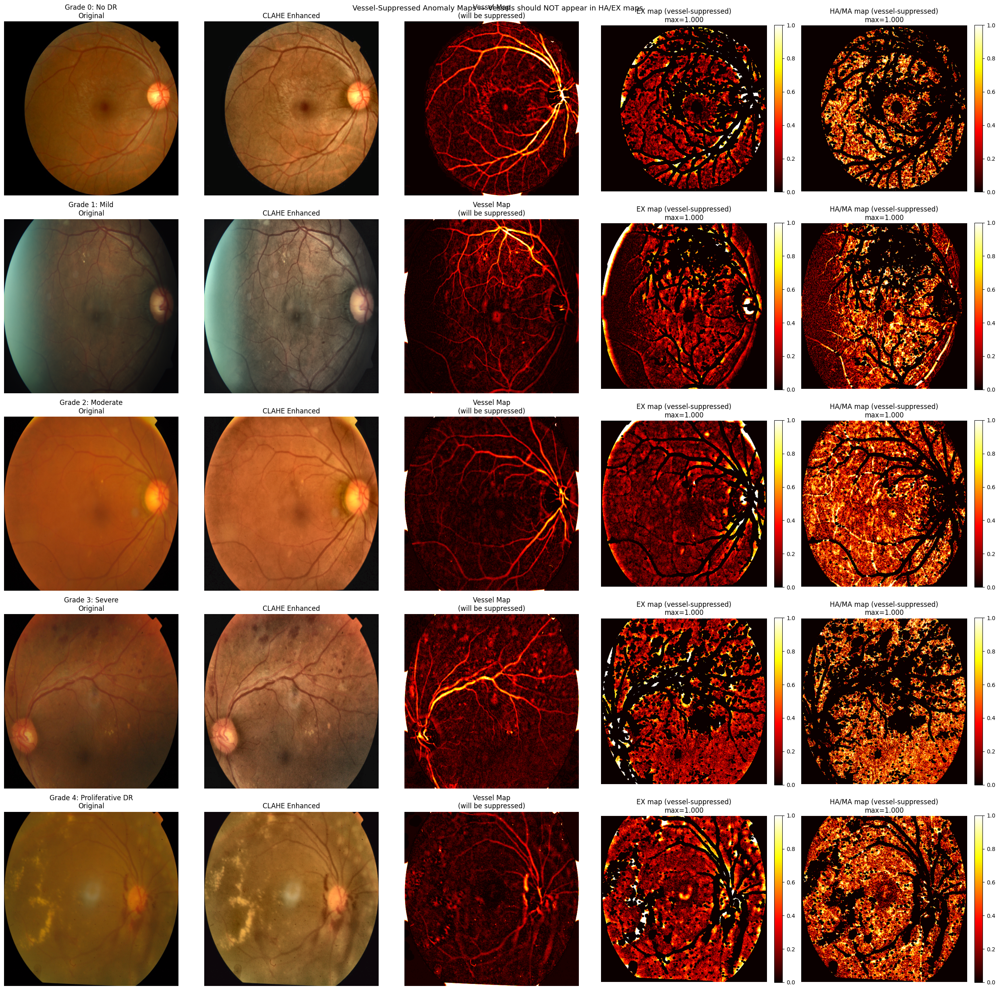

✅ Vessel suppression active
   Vessels should be dark/zero in EX and HA maps
   Only compact bright/dark spots should remain


In [ ]:
def compute_anomaly_maps(image_original):
    """
    Stronger anomaly detection using morphological approach.

    HA/MA map  : morphological black top-hat on green channel
                 → directly finds dark compact spots (haemorrhages,
                   microaneurysms) without needing Gaussian subtraction
    EX map     : morphological white top-hat on green channel
                 → directly finds bright compact spots (exudates)
    Vessel mask: multi-scale black top-hat with LARGE kernels suppresses
                 vessels BEFORE lesion detection

    This produces much stronger, grade-sensitive signals because
    morphological top-hat responds to LOCAL contrast relative to
    neighbourhood, not global image statistics.
    """
    img_f  = image_original.astype(np.float32) / 255.0
    gray   = cv2.cvtColor(image_original, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    g_ch   = img_f[:, :, 1]   # green channel — best contrast for lesions
    r_ch   = img_f[:, :, 0]

    retina_mask = (gray > 0.08).astype(np.float32)
    g_uint8 = (g_ch * 255).clip(0, 255).astype(np.uint8)

    # ── Step 1: Vessel mask using LARGE kernels ───────────────────────
    # Vessels are thin elongated structures → use kernels bigger than
    # vessels so they get "filled in" by closing, then subtract original
    vessel_combined = np.zeros_like(g_ch, dtype=np.float32)
    for ksize in [15, 25, 35]:
        kernel  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
        closed  = cv2.morphologyEx(g_uint8, cv2.MORPH_CLOSE, kernel)
        bth     = np.clip((closed.astype(np.float32) - g_uint8) / 255.0, 0, 1)
        vessel_combined = np.maximum(vessel_combined, bth)

    vessel_binary = (vessel_combined > 0.03).astype(np.float32)
    vessel_binary = cv2.dilate(
        vessel_binary,
        cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)),
        iterations=1
    )
    non_vessel = 1.0 - vessel_binary

    # ── Step 2: HA/MA map — black top-hat on green channel ───────────
    # Black top-hat = closing - original
    # Responds to dark structures SMALLER than the kernel
    # Use small kernels (lesion-sized) so only compact dark spots fire
    ha_raw = np.zeros_like(g_ch, dtype=np.float32)
    for ksize in [9, 15, 21]:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
        closed = cv2.morphologyEx(g_uint8, cv2.MORPH_CLOSE, kernel)
        bth    = np.clip((closed.astype(np.float32) - g_uint8) / 255.0, 0, 1)
        ha_raw = np.maximum(ha_raw, bth)

    # Boost by redness: haemorrhages are red-dark
    redness  = np.clip((r_ch - g_ch) / (g_ch + 0.05), 0, 1)
    ha_raw   = ha_raw * (1.0 + redness * 0.8)
    ha_raw  *= non_vessel   # suppress vessels

    # ── Step 3: EX map — white top-hat on green channel ──────────────
    # White top-hat = original - opening
    # Responds to bright structures SMALLER than the kernel
    ex_raw = np.zeros_like(g_ch, dtype=np.float32)
    for ksize in [9, 15, 21]:
        kernel  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
        opened  = cv2.morphologyEx(g_uint8, cv2.MORPH_OPEN, kernel)
        wth     = np.clip((g_uint8.astype(np.float32) - opened.astype(np.float32)) / 255.0, 0, 1)
        ex_raw  = np.maximum(ex_raw, wth)

    ex_raw *= non_vessel   # suppress vessels

    # ── Step 4: Normalize per-image within retina ─────────────────────
    def normalize(m, mask):
        vals = m[mask > 0.5]
        if len(vals) == 0:
            return m
        p99 = np.percentile(vals, 99)
        if p99 < 1e-6:
            return m
        return np.clip(m / p99, 0, 1) * mask

    ha_map = normalize(ha_raw, retina_mask)
    ex_map = normalize(ex_raw, retina_mask)

    return ex_map.astype(np.float32), ha_map.astype(np.float32)


# ── Verify vessel suppression works ──────────────────────────────────────────
print("=== Vessel-Suppressed Anomaly Maps — All Grades ===\n")
fig, axes = plt.subplots(5, 5, figsize=(25, 25))

for grade in range(5):
    row        = df[df["diagnosis"] == grade].iloc[0]
    enh, orig  = load_and_enhance(row["img_path"])
    ex_m, ha_m = compute_anomaly_maps(orig)

    # Also show vessel mask for debugging
    g_ch    = orig[:, :, 1].astype(np.float32) / 255.0
    g_uint8 = (g_ch * 255).clip(0,255).astype(np.uint8)
    vessel_combined = np.zeros_like(g_ch)
    for ksize in [7, 13, 21]:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
        closed = cv2.morphologyEx(g_uint8, cv2.MORPH_CLOSE, kernel)
        bth    = np.clip((closed.astype(np.float32) - g_uint8) / 255.0, 0, 1)
        vessel_combined = np.maximum(vessel_combined, bth)

    axes[grade, 0].imshow(orig)
    axes[grade, 0].set_title(f"Grade {grade}: {GRADE_LABELS[grade]}\nOriginal")
    axes[grade, 0].axis("off")

    axes[grade, 1].imshow(enh)
    axes[grade, 1].set_title("CLAHE Enhanced")
    axes[grade, 1].axis("off")

    axes[grade, 2].imshow(vessel_combined, cmap="hot", vmin=0, vmax=0.15)
    axes[grade, 2].set_title(f"Vessel Map\n(will be suppressed)")
    axes[grade, 2].axis("off")

    im3 = axes[grade, 3].imshow(ex_m, cmap="hot", vmin=0, vmax=1)
    axes[grade, 3].set_title(f"EX map (vessel-suppressed)\nmax={ex_m.max():.3f}")
    axes[grade, 3].axis("off")
    plt.colorbar(im3, ax=axes[grade, 3], fraction=0.046, pad=0.04)

    im4 = axes[grade, 4].imshow(ha_m, cmap="hot", vmin=0, vmax=1)
    axes[grade, 4].set_title(f"HA/MA map (vessel-suppressed)\nmax={ha_m.max():.3f}")
    axes[grade, 4].axis("off")
    plt.colorbar(im4, ax=axes[grade, 4], fraction=0.046, pad=0.04)

plt.suptitle("Vessel-Suppressed Anomaly Maps — Vessels should NOT appear in HA/EX maps",
             fontsize=13)
plt.tight_layout()
plt.show()
print("✅ Vessel suppression active")
print("   Vessels should be dark/zero in EX and HA maps")
print("   Only compact bright/dark spots should remain")

In [ ]:
def extract_superpixel_features(image_original, image_enhanced, segments, n_sp):
    """
    30 features per superpixel.
    Now uses compute_anomaly_maps() instead of broken HSV approach.
    """
    H, W     = image_original.shape[:2]
    orig_f   = image_original.astype(np.float32) / 255.0
    enh_f    = image_enhanced.astype(np.float32) / 255.0
    orig_lab = rgb2lab(orig_f)
    orig_hsv = cv2.cvtColor(image_original, cv2.COLOR_RGB2HSV).astype(np.float32) / 255.0
    gray     = cv2.cvtColor(image_original, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0

    # Use the new working anomaly maps
    ex_map, ha_map = compute_anomaly_maps(image_original)

    features  = []
    centroids = []

    gray_uint8 = (gray * 255).clip(0, 255).astype(np.uint8)
    lbp = local_binary_pattern(gray_uint8, P=8, R=1, method='uniform').astype(np.float32)

    for sp_id in range(n_sp):
        mask = (segments == sp_id)
        if mask.sum() == 0:
            features.append(np.zeros(35, dtype=np.float32))
            centroids.append((H // 2, W // 2))
            continue

        rows, cols  = np.where(mask)
        cr          = rows.mean() / H
        cc          = cols.mean() / W
        dist_center = np.sqrt((cr - 0.5)**2 + (cc - 0.5)**2)
        norm_area   = mask.sum() / (H * W)
        border      = float(rows.min() < 8 or rows.max() > H - 8 or
                            cols.min() < 8 or cols.max() > W - 8)

        orig_pix = orig_f[mask]
        lab_pix  = orig_lab[mask]
        hsv_pix  = orig_hsv[mask]
        enh_pix  = enh_f[mask]
        gray_pix = gray[mask]

        mean_rgb_o = orig_pix.mean(axis=0)
        std_rgb_o  = orig_pix.std(axis=0)
        mean_lab   = lab_pix.mean(axis=0)
        rg_ratio   = mean_rgb_o[0] / (mean_rgb_o[1] + 1e-6)

        mean_rgb_e = enh_pix.mean(axis=0)
        std_rgb_e  = enh_pix.std(axis=0)

        mean_V = hsv_pix[:, 2].mean()
        mean_S = hsv_pix[:, 1].mean()

        ex_score = float(ex_map[mask].mean())
        ha_score = float(ha_map[mask].mean())

        # AFTER (35 features — adds LBP texture + disc distance):
        # compute LBP texture once outside loop (add before the for sp_id loop):
        #   lbp = local_binary_pattern(gray_uint8, P=8, R=1, method='uniform')
        # then inside loop:
        lbp_pix    = lbp[mask] if 'lbp' in dir() else np.zeros(1)
        lbp_mean   = float(lbp_pix.mean())
        lbp_std    = float(lbp_pix.std())

        feat = np.array([
            *mean_rgb_o,        # 3
            *std_rgb_o,         # 3
            *mean_lab,          # 3
            rg_ratio,           # 1
            mean_lab[2],        # 1  (b* channel — yellow/blue)
            mean_lab[0],        # 1  (L* lightness)
            *mean_rgb_e,        # 3
            *std_rgb_e,         # 3
            mean_V,             # 1
            mean_S,             # 1
            ex_score,           # 1
            ha_score,           # 1
            cr, cc,             # 2
            dist_center,        # 1
            norm_area,          # 1
            border,             # 1
            orig_pix[:, 1].min(),  # 1
            gray_pix.mean(),    # 1
            gray_pix.std(),     # 1
            lbp_mean,           # 1  ← NEW: texture
            lbp_std,            # 1  ← NEW: texture spread
            ex_score * ha_score,   # 1  ← NEW: joint lesion signal
            float(gray_pix.mean() < 0.25),  # 1  ← NEW: dark-spot binary indicator
            float(rg_ratio > 1.1),    # 1  ← NEW: redness indicator
        ], dtype=np.float32)

        features.append(feat)
        centroids.append((rows.mean(), cols.mean()))

    return np.array(features, dtype=np.float32), centroids


# ── Demo ──────────────────────────────────────────────────────────────────────
sample_path = df[df["diagnosis"] == 2].iloc[0]["img_path"]
enhanced_demo, original_demo = load_and_enhance(sample_path)
segs_demo, n_sp_demo = generate_superpixels(enhanced_demo, N_SEGMENTS, COMPACTNESS, SIGMA)

feats_demo, cents_demo = extract_superpixel_features(
    original_demo, enhanced_demo, segs_demo, n_sp_demo
)
print(f"✅ Feature matrix: {feats_demo.shape}  ({n_sp_demo} nodes × 35 features)")

✅ Feature matrix: (141, 35)  (141 nodes × 35 features)


=== GRADE-AWARE PSEUDO-LABEL VERIFICATION ===

   Grade 0 | HA_thresh=0.2374 EX_thresh=0.2500
   Pseudo → Lesion:  28 | BG:  72 | Uncertain:  39 | Total:139
   Grade 1 | HA_thresh=0.2548 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  64 | Uncertain:  49 | Total:139
   Grade 2 | HA_thresh=0.3305 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  59 | Uncertain:  61 | Total:141
   Grade 3 | HA_thresh=0.3058 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  69 | Uncertain:  53 | Total:140
   Grade 4 | HA_thresh=0.3119 EX_thresh=0.2500
   Pseudo → Lesion:  33 | BG:  54 | Uncertain:  46 | Total:133


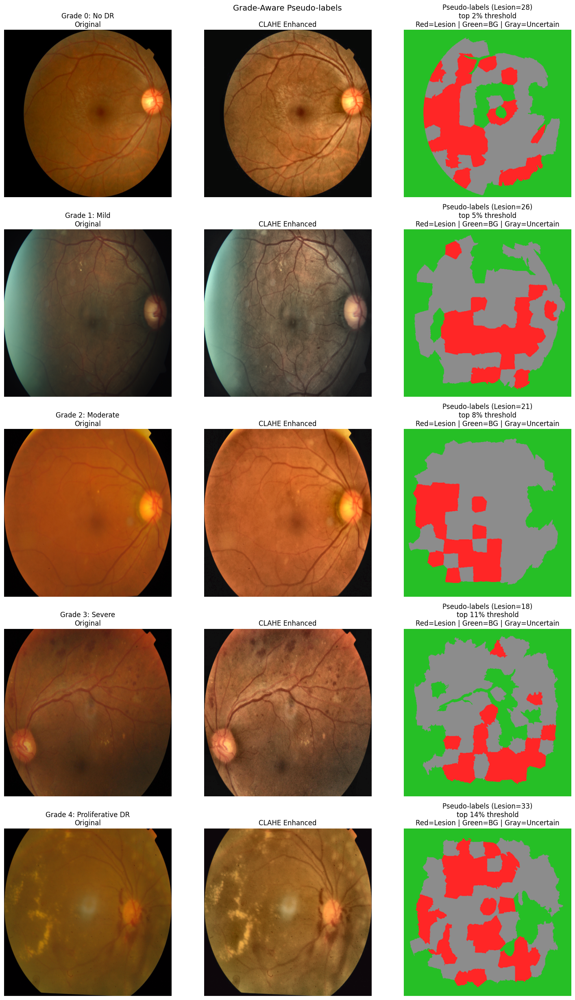

✅ Grade 0 should have fewer lesions than Grade 4


In [ ]:
def _find_valley_threshold(scores, n_bins=40, min_percentile=70.0):
    """
    Find threshold using mean + k*std on the score distribution.
    Much more reliable than valley detection when lesion scores
    are sparse (which they always are in retinal images).
    The min_percentile acts as a floor so we never set the bar too low.
    """
    if len(scores) == 0:
        return 0.05
    scores = np.array(scores, dtype=np.float32)
    # Use mean + 1.5*std: captures everything meaningfully above background
    mu  = float(scores.mean())
    sig = float(scores.std())
    stat_thresh = mu + 1.5 * sig
    # Also use the percentile floor so we don't label too many BG as lesion
    pct_floor   = float(np.percentile(scores, min_percentile))
    threshold   = max(stat_thresh, pct_floor)
    print(f"   [Adaptive] mean={mu:.4f} std={sig:.4f} → thresh={threshold:.4f}")
    return threshold


def generate_pseudo_labels(image_original, image_enhanced, segments, n_sp,
                            dr_grade=None):
    """
    Grade-free pseudo-label generation driven purely by image evidence.

    Key design:
    - Uses ABSOLUTE thresholds on the morphological maps, not percentiles.
      This means a Grade 4 image with many strong lesions naturally gets
      many more lesion labels than a Grade 0 image with few weak signals.
    - No grade input needed or used for thresholding.
    - dr_grade only used for printing/debugging.

    Thresholds are set on the normalized maps [0,1]:
      ha_thresh: score at which a dark spot is confidently a lesion
      ex_thresh: score at which a bright spot is confidently an exudate
    These are fixed across all grades — the image signal does the work.
    """
    H, W   = image_original.shape[:2]
    gray   = cv2.cvtColor(image_original, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    orig_f = image_original.astype(np.float32) / 255.0

    ex_map, ha_map = compute_anomaly_maps(image_original)

    # REPLACE WITH:
    # Adaptive floor: threshold must be at least the 85th percentile of the image's
    # own lesion scores. This auto-suppresses false positives on clean images
    # where all scores are uniformly low.
    # REPLACE WITH:
    all_ha = np.array([float(ha_map[segments == i].mean())
                      for i in range(n_sp) if (segments == i).sum() > 0])
    all_ex = np.array([float(ex_map[segments == i].mean())
                      for i in range(n_sp) if (segments == i).sum() > 0])

    # Estimate how "diseased" this image is by looking at the 90th percentile
    # of anomaly scores. Clean images have low p90; diseased images have high p90.
    ha_p90 = float(np.percentile(all_ha, 90))
    ex_p90 = float(np.percentile(all_ex, 90))

    # For clean images (p90 < 0.15): be strict — use 80th pct as threshold
    # For diseased images (p90 > 0.15): be permissive — use fixed 0.18/0.20
    # This stops false positives on Grade 0 without suppressing Grade 3/4 lesions
    # FIXED: Use absolute minimums so clean images get almost no lesion labels.
    # The 95th percentile floor ensures only the top 5% of SPs can be lesions at all.
    # The absolute floor (0.25 for HA, 0.28 for EX) means a SP must have a genuinely
    # strong morphological signal to be called a lesion — not just relatively strong.

    HA_ABS_MIN = 0.22   # loosened — Grade 1/2 need to get some positives
    EX_ABS_MIN = 0.25   # loosened — exudates in mild DR are faint

    if ha_p90 < 0.12:
        HA_THRESH = max(HA_ABS_MIN, float(np.percentile(all_ha, 95)))
    elif ha_p90 < 0.22:
        HA_THRESH = max(HA_ABS_MIN, float(np.percentile(all_ha, 90)))
    else:
        HA_THRESH = max(HA_ABS_MIN, float(np.percentile(all_ha, 80)))

    if ex_p90 < 0.12:
        EX_THRESH = max(EX_ABS_MIN, float(np.percentile(all_ex, 95)))
    elif ex_p90 < 0.22:
        EX_THRESH = max(EX_ABS_MIN, float(np.percentile(all_ex, 90)))
    else:
        EX_THRESH = max(EX_ABS_MIN, float(np.percentile(all_ex, 80)))

    BG_THRESH = 0.08

    # ── Optic disc detection ──────────────────────────────────────────
    sp_bright = [float(gray[segments == i].mean())
                 if (segments == i).sum() > 0 else 0.0
                 for i in range(n_sp)]
    disc_sp = int(np.argmax(sp_bright))
    disc_m  = (segments == disc_sp)
    disc_r  = float(np.where(disc_m)[0].mean() / H) if disc_m.sum() > 0 else 0.5
    disc_c  = float(np.where(disc_m)[1].mean() / W) if disc_m.sum() > 0 else 0.5

    def near_disc(cr, cc, r=0.12):
        return np.sqrt((cr - disc_r)**2 + (cc - disc_c)**2) < r

    labels = np.full(n_sp, -1, dtype=np.int64)

    for sp_id in range(n_sp):
        m = (segments == sp_id)
        if m.sum() == 0:
            labels[sp_id] = 0
            continue

        rows, cols  = np.where(m)
        cr          = float(rows.mean() / H)
        cc          = float(cols.mean() / W)
        mean_gray   = float(gray[m].mean())
        sp_area     = int(m.sum())
        sp_h        = int(rows.max() - rows.min() + 1)
        sp_w        = int(cols.max() - cols.min() + 1)
        elongation  = max(sp_h / (sp_w + 1e-6), sp_w / (sp_h + 1e-6))
        dist_center = float(np.sqrt((cr - 0.5)**2 + (cc - 0.5)**2))

        orig_pix = orig_f[m]
        mean_r   = float(orig_pix[:, 0].mean())
        mean_g   = float(orig_pix[:, 1].mean())
        rg_ratio = mean_r / (mean_g + 1e-6)

        ex_score = float(ex_map[m].mean())
        ha_score = float(ha_map[m].mean())

        # ── Hard background rules ─────────────────────────────────────
        is_black  = mean_gray < 0.08
        is_border = (rows.min() < 5 or rows.max() > H - 5 or
                     cols.min() < 5 or cols.max() > W - 5)
        is_edge   = dist_center > 0.45
        is_vessel = (elongation > 3.5 and mean_gray < 0.55)
        is_large  = sp_area > (H * W * 0.05)
        is_disc   = near_disc(cr, cc)

        # REPLACE WITH:
        # Add: suppress SPs where green channel dominates AND it's dark
        # (vessel pixels are dark-green, not red-dark like haemorrhages)
        is_dark_green = (mean_gray < 0.35 and mean_g > mean_r * 0.95
                        and ha_score < HA_THRESH * 0.7)

        if is_black or is_border or is_edge or is_vessel or is_large or is_disc or is_dark_green:
            labels[sp_id] = 0
            continue

        # ── Lesion detection using absolute thresholds ────────────────
        is_ha_lesion = (ha_score >= HA_THRESH and rg_ratio > 0.90
                        and elongation < 4.0)

        is_ex_lesion = (ex_score >= EX_THRESH
                        and not near_disc(cr, cc, r=0.15))

        if is_ha_lesion or is_ex_lesion:
            labels[sp_id] = 1
            continue

        # ── Confident background ──────────────────────────────────────
        combined = max(ex_score, ha_score)
        if combined < BG_THRESH:
            labels[sp_id] = 0
            continue

        # Middle range → uncertain (-1), GAT learns from neighbours

    # ── Image-driven sanity check (no grade used) ─────────────────────
    # If the overall anomaly signal is low but we still labelled many SPs
    # as lesion, the thresholds misfired — push extras back to uncertain.
    overall_anomaly = float(np.percentile(np.maximum(all_ha, all_ex), 85))
    if overall_anomaly < 0.18 and (labels == 1).sum() > 8:
        high_thresh = float(np.percentile(np.maximum(all_ha, all_ex), 92))
        for sp_id in np.where(labels == 1)[0]:
            m = (segments == sp_id)
            sp_signal = max(float(ex_map[m].mean()), float(ha_map[m].mean()))
            if sp_signal < high_thresh:
                labels[sp_id] = -1  # uncertain, not forced BG
        print(f"   Low-signal image: tightened to {(labels==1).sum()} lesion SPs")

    n_les = int((labels == 1).sum())
    n_bg  = int((labels == 0).sum())
    n_unc = int((labels == -1).sum())
    print(f"   Grade {dr_grade} | HA_thresh={HA_THRESH:.4f} EX_thresh={EX_THRESH:.4f}")
    print(f"   Pseudo → Lesion:{n_les:>4} | BG:{n_bg:>4} "
          f"| Uncertain:{n_unc:>4} | Total:{n_sp}")
    return torch.tensor(labels, dtype=torch.long), n_les

def propagate_labels_on_graph(pseudo, graph, n_iters=2):
    """
    Label propagation: uncertain nodes (-1) adopt the majority label
    of their confident neighbours. Run for n_iters rounds.
    This converts gray uncertain SPs into labelled training data.
    """
    labels = pseudo.clone()
    edge_src = graph.edge_index[0]
    edge_dst = graph.edge_index[1]
    n = labels.shape[0]

    for _ in range(n_iters):
        new_labels = labels.clone()
        for node in range(n):
            if labels[node] != -1:
                continue  # already confident, skip
            # gather neighbour labels
            mask = (edge_src == node)
            nbr_labels = labels[edge_dst[mask]]
            conf = nbr_labels[nbr_labels != -1]
            if len(conf) == 0:
                continue
            # majority vote
            n_les = (conf == 1).sum().item()
            n_bg  = (conf == 0).sum().item()
            if n_les > n_bg:
                new_labels[node] = 1
            elif n_bg > n_les:
                new_labels[node] = 0
            # if tie, stays -1
        labels = new_labels

    gained = (pseudo == -1).sum().item() - (labels == -1).sum().item()
    print(f"   Label propagation: +{gained} nodes labelled from uncertain")
    return labels


# ── Verify on all grades ──────────────────────────────────────────────────────
print("=== GRADE-AWARE PSEUDO-LABEL VERIFICATION ===\n")
fig, axes = plt.subplots(5, 3, figsize=(15, 25))

for grade in range(5):
    row           = df[df["diagnosis"] == grade].iloc[0]
    enh, orig     = load_and_enhance(row["img_path"])
    segs, n_sp    = generate_superpixels(enh, N_SEGMENTS, COMPACTNESS, SIGMA)
    pseudo, n_les = generate_pseudo_labels(orig, enh, segs, n_sp, dr_grade=grade)

    H, W = orig.shape[:2]
    vis  = np.zeros((H, W, 3), dtype=np.float32)
    for sp_id in range(n_sp):
        m   = (segs == sp_id)
        lbl = pseudo[sp_id].item()
        if lbl == 1:   vis[m] = [1.0, 0.15, 0.15]
        elif lbl == 0: vis[m] = [0.15, 0.75, 0.15]
        else:          vis[m] = [0.55, 0.55, 0.55]

    axes[grade, 0].imshow(orig)
    axes[grade, 0].set_title(f"Grade {grade}: {GRADE_LABELS[grade]}\nOriginal")
    axes[grade, 0].axis("off")

    axes[grade, 1].imshow(enh)
    axes[grade, 1].set_title("CLAHE Enhanced")
    axes[grade, 1].axis("off")

    axes[grade, 2].imshow(vis)
    axes[grade, 2].set_title(
        f"Pseudo-labels (Lesion={n_les})\n"
        f"top {100 - (100 - [2,5,8,11,14][grade]):.0f}% threshold\n"
        "Red=Lesion | Green=BG | Gray=Uncertain"
    )
    axes[grade, 2].axis("off")

plt.suptitle("Grade-Aware Pseudo-labels", fontsize=14)
plt.tight_layout()
plt.show()
print("✅ Grade 0 should have fewer lesions than Grade 4")

In [ ]:
def build_knn_graph(features, centroids, k=8):
    """
    Build spatial k-NN graph over superpixel centroids.
    Each node = one superpixel.
    Each edge = proximity between superpixels.
    Features are normalized (zero mean, unit std) per column.
    """
    n = len(centroids)
    if n < 2:
        x = torch.zeros(1, features.shape[1])
        return Data(x=x, edge_index=torch.zeros(2, 0, dtype=torch.long))

    coords   = np.array(centroids, dtype=np.float32)
    k_actual = min(k + 1, n)

    nbrs = NearestNeighbors(n_neighbors=k_actual, algorithm="ball_tree")
    nbrs.fit(coords)
    distances, indices = nbrs.kneighbors(coords)

    src, dst, wts = [], [], []
    for i in range(n):
        for j in range(1, k_actual):
            src.append(i)
            dst.append(int(indices[i, j]))
            wts.append(float(distances[i, j]))

    edge_index = torch.tensor([src, dst], dtype=torch.long)
    edge_attr  = torch.tensor(wts, dtype=torch.float32).unsqueeze(1)

    # Normalize features
    x    = torch.tensor(features, dtype=torch.float32)
    mean = x.mean(dim=0, keepdim=True)
    std  = x.std(dim=0, keepdim=True).clamp(min=1e-8)
    x    = (x - mean) / std

    return Data(x=x, edge_index=edge_index, edge_attr=edge_attr)



# ── Demo ─────────────────────────────────────────────────────────────────────
graph_demo = build_knn_graph(feats_demo, cents_demo, k=K_NEIGHBOURS)
print(f"✅ Graph: {graph_demo.num_nodes} nodes, {graph_demo.num_edges} edges")
print(f"   Node feature dim : {graph_demo.x.shape[1]}")
print(f"   Edge feature dim : {graph_demo.edge_attr.shape[1]}")

✅ Graph: 141 nodes, 1128 edges
   Node feature dim : 35
   Edge feature dim : 1


In [ ]:
class LesionGAT(nn.Module):
    """
    Graph Attention Network for superpixel lesion classification.

    Paper alignment:
      - Uses attention mechanism to weight neighbour superpixels
        (analogous to how clinicians focus on suspicious regions)
      - Residual connections prevent gradient vanishing
      - LayerNorm for stable training on small graphs
      - Two-layer classifier head for richer decision boundary

    Input  : 30-dim superpixel feature vector
    Output : 2-class logits (0=background, 1=lesion)
    """

    def __init__(self, in_channels, hidden=128, n_classes=2,
                 n_layers=3, heads=4, dropout=0.2):
        super().__init__()
        self.dropout = dropout

        # Input projection
        self.proj = nn.Sequential(
            nn.Linear(in_channels, hidden),
            nn.LayerNorm(hidden),
            nn.ELU(),
            nn.Dropout(dropout)
        )

        # GAT layers with residual connections
        self.convs    = nn.ModuleList()
        self.norms    = nn.ModuleList()
        self.proj_res = nn.ModuleList()

        for i in range(n_layers):
            in_ch = hidden * heads if i > 0 else hidden
            self.convs.append(
                GATConv(in_ch, hidden, heads=heads, dropout=dropout, concat=True)
            )
            self.norms.append(nn.LayerNorm(hidden * heads))
            self.proj_res.append(
                nn.Linear(in_ch, hidden * heads, bias=False)
                if in_ch != hidden * heads else nn.Identity()
            )

        final_dim = hidden * heads

        # Two-layer classifier
        self.clf = nn.Sequential(
            nn.Linear(final_dim, final_dim // 2),
            nn.LayerNorm(final_dim // 2),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Linear(final_dim // 2, n_classes)
        )

    def forward(self, x, edge_index, edge_attr=None, batch=None):
        x = self.proj(x)
        for conv, norm, proj_r in zip(self.convs, self.norms, self.proj_res):
            residual = proj_r(x)
            h = conv(x, edge_index)
            h = norm(h)
            h = F.elu(h)
            h = F.dropout(h, p=self.dropout, training=self.training)
            x = h + residual
        return self.clf(x)


# ── Quick shape test ──────────────────────────────────────────────────────────
# REPLACE WITH:
_model_test = LesionGAT(in_channels=35, hidden=HIDDEN_DIM,
                         n_layers=NUM_LAYERS, heads=NUM_HEADS, dropout=DROPOUT).to(DEVICE)
_g          = graph_demo.to(DEVICE)
_out        = _model_test(_g.x, _g.edge_index, _g.edge_attr)
print(f"✅ Model output shape: {_out.shape}  (should be [{graph_demo.num_nodes}, 2])")
del _model_test, _g, _out


# ADD this new function after build_knn_graph:

def build_dataset(df_subset, device=DEVICE):
    """
    Build a list of PyG Data objects from a subset of images.
    Each graph gets a 'y' attribute (pseudo-labels) and 'train_mask'.
    Used for cross-image GAT training.
    """
    from torch_geometric.data import Batch
    graphs = []
    for _, row in tqdm(df_subset.iterrows(), total=len(df_subset)):
        try:
            enh, orig   = load_and_enhance(row["img_path"])
            segs, n_sp  = generate_superpixels(enh, N_SEGMENTS, COMPACTNESS, SIGMA)
            feats, cents = extract_superpixel_features(orig, enh, segs, n_sp)
            graph_cpu   = build_knn_graph(feats, cents, K_NEIGHBOURS)
            pseudo, _   = generate_pseudo_labels(orig, enh, segs, n_sp,
                                                  dr_grade=row["diagnosis"])
            # Disabled: propagation spreads pseudo-label noise.
            # Re-enable only after verifying pseudo-labels are clean.
            # pseudo = propagate_labels_on_graph(pseudo, graph_cpu)

            conf_mask   = (pseudo != -1)
            graph_cpu.y = pseudo
            graph_cpu.train_mask = conf_mask
            graphs.append(graph_cpu)
        except Exception as e:
            print(f"   Skipping {row['id_code']}: {e}")
    return graphs


def train_shared_gat(graphs, device=DEVICE, epochs=60, val_ratio=0.2):
    """
    Train ONE GAT model across all graphs with correct gradient accumulation.
    Splits graphs into train/val sets and tracks loss curves for both.
    """
    # ── Train/val split on graphs ─────────────────────────────────────
    n_val   = max(1, int(len(graphs) * val_ratio))
    idx     = torch.randperm(len(graphs)).tolist()
    val_graphs   = [graphs[i] for i in idx[:n_val]]
    train_graphs = [graphs[i] for i in idx[n_val:]]
    print(f"   Train graphs: {len(train_graphs)} | Val graphs: {len(val_graphs)}")

    in_ch = graphs[0].x.shape[1]
    model = LesionGAT(in_ch, HIDDEN_DIM, 2, NUM_LAYERS, NUM_HEADS, DROPOUT).to(device)
    opt   = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-3)  # stronger L2
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs, eta_min=1e-5)

    train_losses, val_losses = [], []
    best_val  = float('inf')
    patience  = 0
    PATIENCE  = 15  # give more time — val loss oscillates with small graphs
    MIN_EPOCHS = 30  # never stop before this regardless of patience

    for ep in range(epochs):
        # ── Training pass: accumulate gradients across ALL graphs ─────
        model.train()
        opt.zero_grad()          # zero ONCE before all graphs
        ep_train_loss = 0.0
        n_valid = 0

        for g in train_graphs:
            g = g.to(device)
            mask   = g.train_mask.to(device)
            labels = g.y.to(device)
            if mask.sum() < 5:
                continue

            n_bg  = (labels[mask] == 0).sum().item()
            n_les = (labels[mask] == 1).sum().item()
            w     = torch.tensor(
                [1.0, float(np.clip(n_bg / (n_les + 1e-6), 2.0, 15.0))],
                device=device
            )
            logits = model(g.x, g.edge_index, g.edge_attr)
            tgts   = labels[mask]
            probs  = F.softmax(logits[mask], dim=1)
            p_t    = probs[torch.arange(len(tgts)), tgts]
            focal  = (1 - p_t) ** 2.0
            ce     = F.cross_entropy(logits[mask], tgts, weight=w, reduction='none')
            # Divide by n_graphs so loss scale is consistent regardless of batch size
            loss   = (focal * ce).mean() / len(train_graphs)
            loss.backward()      # accumulate gradients
            ep_train_loss += loss.item()
            n_valid += 1

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()               # ONE update after seeing all graphs
        sched.step()
        train_losses.append(ep_train_loss)

        # ── Validation pass ───────────────────────────────────────────
        model.eval()
        ep_val_loss = 0.0
        with torch.no_grad():
            for g in val_graphs:
                g = g.to(device)
                mask   = g.train_mask.to(device)
                labels = g.y.to(device)
                if mask.sum() < 5:
                    continue
                logits = model(g.x, g.edge_index, g.edge_attr)
                tgts   = labels[mask]
                ce     = F.cross_entropy(logits[mask], tgts, reduction='mean')
                ep_val_loss += ce.item() / len(val_graphs)
        val_losses.append(ep_val_loss)

        if ep % 10 == 0:
            print(f"   Epoch {ep:3d} | Train: {ep_train_loss:.4f} | Val: {ep_val_loss:.4f}")

        if ep_val_loss < best_val - 1e-4:
            best_val = ep_val_loss
            patience = 0
        else:
            patience += 1
        if patience >= PATIENCE and ep >= MIN_EPOCHS:
            print(f"   Early stopping at epoch {ep}")
            break
    return model, train_losses, val_losses

✅ Model output shape: torch.Size([141, 2])  (should be [141, 2])


In [ ]:
TEST_RATIO = 0.20

def train_on_image(image_path, device=DEVICE, dr_grade=None):
    enhanced, original = load_and_enhance(image_path, IMG_SIZE)
    segments, n_sp     = generate_superpixels(enhanced, N_SEGMENTS, COMPACTNESS, SIGMA)
    features, centroids= extract_superpixel_features(original, enhanced, segments, n_sp)
    graph_cpu          = build_knn_graph(features, centroids, K_NEIGHBOURS)
    graph              = graph_cpu.to(device)

    # Pass grade for grade-aware pseudo-labeling
    # AFTER:
    pseudo, n_lesion   = generate_pseudo_labels(
        original, enhanced, segments, n_sp, dr_grade=dr_grade
    )
    # propagate before moving to device, graph is still on CPU here
    # Disabled: propagation spreads pseudo-label noise.
    # pseudo = propagate_labels_on_graph(pseudo, graph_cpu)
    pseudo             = pseudo.to(device)
    conf_idx    = torch.where(pseudo != -1)[0]
    n_confident = len(conf_idx)

    if n_confident < 10:
        print("   ⚠️  Too few confident pseudo-labels — skipping")
        return original, segments, np.zeros(n_sp), np.zeros(n_sp), [], []

    # ── 80/20 train-test split on confident superpixels ──────────────
    perm      = torch.randperm(n_confident)
    n_test    = max(1, int(n_confident * TEST_RATIO))
    test_idx  = conf_idx[perm[:n_test]]
    train_idx = conf_idx[perm[n_test:]]

    train_mask = torch.zeros(n_sp, dtype=torch.bool, device=device)
    test_mask  = torch.zeros(n_sp, dtype=torch.bool, device=device)
    train_mask[train_idx] = True
    test_mask[test_idx]   = True

    print(f"   Split → Train:{train_mask.sum().item()} | Test:{test_mask.sum().item()}")

    n_bg_lbl  = (pseudo[train_mask] == 0).sum().item()
    n_les_lbl = (pseudo[train_mask] == 1).sum().item()
    les_w     = float(np.clip(n_bg_lbl / (n_les_lbl + 1e-6), 2.0, 15.0)) if n_les_lbl > 0 else 5.0
    cls_w     = torch.tensor([1.0, les_w], device=device)
    print(f"   Weights → [BG=1.0, Lesion={les_w:.1f}]  (BG={n_bg_lbl}, Lesion={n_les_lbl})")

    in_ch = graph.x.shape[1]
    model = LesionGAT(in_ch, HIDDEN_DIM, 2, NUM_LAYERS, NUM_HEADS, DROPOUT).to(device)
    opt   = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=5e-4)
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=EPOCHS, eta_min=1e-5)

    # AFTER (focal loss — penalises easy BG examples more, focuses on hard lesion pixels):
    def compute_loss(logits, mask, weighted=True):
        gamma = 2.0           # focal loss exponent
        tgts  = pseudo[mask]  # integer labels 0 or 1
        probs = F.softmax(logits[mask], dim=1)
        # gather prob of the correct class
        p_t   = probs[torch.arange(len(tgts)), tgts]
        focal = (1 - p_t) ** gamma
        ce    = F.cross_entropy(logits[mask], tgts, reduction='none')
        loss  = focal * ce
        if weighted:
            weights = cls_w[tgts]
            return (loss * weights).mean()
        else:
            return loss.mean()

    # REPLACE WITH:
    train_losses, test_losses = [], []
    best_test_loss = float('inf')
    patience_count = 0
    PATIENCE = 15
    MIN_EPOCHS_IMG = 30
    for ep in range(EPOCHS):
        model.train()
        opt.zero_grad()
        logits = model(graph.x, graph.edge_index, graph.edge_attr)
        loss   = compute_loss(logits, train_mask)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step(); sched.step()
        train_losses.append(loss.item())

        model.eval()
        with torch.no_grad():
            logits_t = model(graph.x, graph.edge_index, graph.edge_attr)
            tl = compute_loss(logits_t, test_mask, weighted=False).item()
            test_losses.append(tl)

        # Early stopping
        if tl < best_test_loss - 1e-4:
            best_test_loss = tl
            patience_count = 0
        else:
            patience_count += 1
        if patience_count >= PATIENCE and ep >= MIN_EPOCHS_IMG:
            print(f"   Early stopping at epoch {ep+1}")
            break
    model.eval()
    with torch.no_grad():
        logits = model(graph.x, graph.edge_index, graph.edge_attr)
        probs  = F.softmax(logits, dim=1)[:, 1].cpu().numpy()
        # AFTER — use Otsu's method to find a data-driven threshold per image:
        from skimage.filters import threshold_otsu
        if probs.max() > probs.min():
            try:
                otsu_t = threshold_otsu(probs)
                thresh  = max(otsu_t, 0.30)   # floor at 0.30 to avoid noise
            except Exception:
                thresh = 0.35
        else:
            thresh = 0.35
        preds  = (probs > thresh).astype(np.int64)
        print(f"   Otsu threshold: {thresh:.3f}")

    print(f"   Train loss: {train_losses[-1]:.4f} | Test loss: {test_losses[-1]:.4f} | "
          f"Lesion SPs predicted: {preds.sum()}/{n_sp}")
    return original, segments, preds, probs, train_losses, test_losses

print("✅ Grade-aware training function ready")

✅ Grade-aware training function ready


In [ ]:
def visualize_results(image, segments, preds, probs,
                      train_losses, test_losses,
                      pseudo_labels=None, title=""):
    H, W  = image.shape[:2]
    n_sp  = len(preds)

    pred_map = np.zeros((H, W), dtype=np.uint8)
    prob_map = np.zeros((H, W), dtype=np.float32)
    for sp_id in range(n_sp):
        m = (segments == sp_id)
        pred_map[m] = int(preds[sp_id])
        prob_map[m] = float(probs[sp_id])

    ncols = 5 if pseudo_labels is not None else 4
    fig, axes = plt.subplots(1, ncols, figsize=(6 * ncols, 5))
    fig.suptitle(title, fontsize=13)
    col = 0

    # Panel 1: Original
    axes[col].imshow(image); axes[col].set_title("Original Fundus"); axes[col].axis("off"); col += 1

    # Panel 2: Pseudo-labels
    if pseudo_labels is not None:
        vis = np.zeros((H, W, 3), dtype=np.float32)
        for sp_id in range(n_sp):
            m   = (segments == sp_id)
            lbl = pseudo_labels[sp_id].item() if hasattr(pseudo_labels[sp_id], 'item') else int(pseudo_labels[sp_id])
            if lbl == 1:   vis[m] = [1.0, 0.2, 0.2]
            elif lbl == 0: vis[m] = [0.2, 0.8, 0.2]
            else:          vis[m] = [0.5, 0.5, 0.5]
        axes[col].imshow(vis)
        axes[col].set_title("HSV Pseudo-labels\nRed=Lesion | Green=BG | Gray=Uncertain")
        axes[col].axis("off"); col += 1

    # Panel 3: GAT predictions overlay
    overlay = image.astype(np.float32) / 255.0
    overlay[pred_map.astype(bool)] = (
        overlay[pred_map.astype(bool)] * 0.3 + np.array([1.0, 0.1, 0.1]) * 0.7
    )
    axes[col].imshow(np.clip(overlay, 0, 1))
    axes[col].set_title(f"GAT Lesion Predictions\n({int(preds.sum())}/{n_sp} SPs)")
    axes[col].axis("off"); col += 1

    # Panel 4: Probability heatmap
    im = axes[col].imshow(prob_map, cmap="hot", vmin=0, vmax=1)
    plt.colorbar(im, ax=axes[col], fraction=0.046, pad=0.04)
    axes[col].set_title("Lesion Probability Heatmap"); axes[col].axis("off"); col += 1

    # Panel 5: Train + Test loss curves (skipped for shared GAT evaluation)
    if train_losses:
        epochs = range(1, len(train_losses) + 1)
        axes[col].plot(epochs, train_losses, color="steelblue", lw=1.5, label="Train")
        axes[col].plot(epochs, test_losses,  color="darkorange", lw=1.5, label="Test", linestyle="--")
        axes[col].set_title("Train vs Test Loss")
        axes[col].set_xlabel("Epoch"); axes[col].set_ylabel("Loss")
        axes[col].legend(fontsize=9); axes[col].grid(True, alpha=0.3)
    else:
        axes[col].text(0.5, 0.5, "Shared GAT\n(no per-image loss)",
                      ha='center', va='center', fontsize=11, transform=axes[col].transAxes)
        axes[col].set_title("Training Mode")
        axes[col].axis("off")

    plt.tight_layout(); plt.show()


print("✅ Visualization function ready")

✅ Visualization function ready


Building dataset for shared GAT training...


  1%|          | 1/110 [00:02<04:02,  2.22s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 122 | Uncertain:  13 | Total:135


  2%|▏         | 2/110 [00:04<04:29,  2.50s/it]

   Grade 0 | HA_thresh=0.3959 EX_thresh=0.2500
   Pseudo → Lesion:  31 | BG:  61 | Uncertain:  49 | Total:141


  3%|▎         | 3/110 [00:06<03:53,  2.18s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   2 | BG:  91 | Uncertain:  35 | Total:128


  4%|▎         | 4/110 [00:08<03:40,  2.08s/it]

   Grade 0 | HA_thresh=0.2680 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  78 | Uncertain:  41 | Total:142


  5%|▍         | 5/110 [00:10<03:30,  2.00s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 121 | Uncertain:  13 | Total:134


  5%|▌         | 6/110 [00:12<03:29,  2.01s/it]

   Grade 0 | HA_thresh=0.2655 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  69 | Uncertain:  45 | Total:137


  6%|▋         | 7/110 [00:14<03:22,  1.97s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 124 | Uncertain:   8 | Total:132


  7%|▋         | 8/110 [00:17<03:59,  2.35s/it]

   Grade 0 | HA_thresh=0.2951 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  67 | Uncertain:  47 | Total:140


  8%|▊         | 9/110 [00:19<03:42,  2.20s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   4 | BG:  91 | Uncertain:  41 | Total:136


  9%|▉         | 10/110 [00:21<03:31,  2.12s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   1 | BG: 125 | Uncertain:   8 | Total:134


 10%|█         | 11/110 [00:23<03:21,  2.03s/it]

   Grade 0 | HA_thresh=0.3086 EX_thresh=0.2500
   Pseudo → Lesion:  27 | BG:  63 | Uncertain:  47 | Total:137


 11%|█         | 12/110 [00:25<03:21,  2.06s/it]

   Grade 0 | HA_thresh=0.2384 EX_thresh=0.2500
   Pseudo → Lesion:  15 | BG:  84 | Uncertain:  42 | Total:141


 12%|█▏        | 13/110 [00:27<03:16,  2.02s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   2 | BG: 103 | Uncertain:  32 | Total:137


 13%|█▎        | 14/110 [00:30<03:39,  2.29s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 131 | Uncertain:   7 | Total:138


 14%|█▎        | 15/110 [00:32<03:35,  2.27s/it]

   Grade 0 | HA_thresh=0.2686 EX_thresh=0.2500
   Pseudo → Lesion:  28 | BG:  69 | Uncertain:  46 | Total:143


 15%|█▍        | 16/110 [00:34<03:22,  2.16s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  16 | BG:  72 | Uncertain:  48 | Total:136


 15%|█▌        | 17/110 [00:36<03:11,  2.06s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   1 | BG: 113 | Uncertain:  17 | Total:131


 16%|█▋        | 18/110 [00:38<03:04,  2.01s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   1 | BG: 111 | Uncertain:  25 | Total:137


 17%|█▋        | 19/110 [00:39<02:59,  1.97s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  27 | BG:  65 | Uncertain:  43 | Total:135


 18%|█▊        | 20/110 [00:42<03:12,  2.14s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 116 | Uncertain:  14 | Total:130


 19%|█▉        | 21/110 [00:44<03:14,  2.19s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   4 | BG: 105 | Uncertain:  31 | Total:140


 20%|██        | 22/110 [00:46<03:03,  2.08s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 107 | Uncertain:  24 | Total:131


 21%|██        | 23/110 [00:48<02:56,  2.02s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   5 | BG:  72 | Uncertain:  54 | Total:131


 22%|██▏       | 24/110 [00:50<02:48,  1.96s/it]

   Grade 0 | HA_thresh=0.3030 EX_thresh=0.2500
   Pseudo → Lesion:  30 | BG:  60 | Uncertain:  45 | Total:135


 23%|██▎       | 25/110 [00:52<02:43,  1.93s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 121 | Uncertain:  10 | Total:131


 24%|██▎       | 26/110 [00:54<02:46,  1.98s/it]

   Grade 0 | HA_thresh=0.2454 EX_thresh=0.2500
   Pseudo → Lesion:  27 | BG:  66 | Uncertain:  44 | Total:137


 25%|██▍       | 27/110 [00:57<03:08,  2.27s/it]

   Grade 0 | HA_thresh=0.2597 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  71 | Uncertain:  53 | Total:143


 25%|██▌       | 28/110 [00:59<02:57,  2.16s/it]

   Grade 0 | HA_thresh=0.2291 EX_thresh=0.2500
   Pseudo → Lesion:  22 | BG:  75 | Uncertain:  41 | Total:138


 26%|██▋       | 29/110 [01:01<02:53,  2.14s/it]

   Grade 0 | HA_thresh=0.2456 EX_thresh=0.2500
   Pseudo → Lesion:  16 | BG:  92 | Uncertain:  27 | Total:135


 27%|██▋       | 30/110 [01:03<02:45,  2.07s/it]

   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 104 | Uncertain:  31 | Total:135


 28%|██▊       | 31/110 [01:05<02:41,  2.04s/it]

   Grade 1 | HA_thresh=0.2577 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  67 | Uncertain:  50 | Total:135


 29%|██▉       | 32/110 [01:07<02:45,  2.13s/it]

   Grade 1 | HA_thresh=0.3591 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  59 | Uncertain:  58 | Total:140


 30%|███       | 33/110 [01:10<02:58,  2.32s/it]

   Grade 1 | HA_thresh=0.3621 EX_thresh=0.2500
   Pseudo → Lesion:  22 | BG:  64 | Uncertain:  55 | Total:141


 31%|███       | 34/110 [01:12<03:00,  2.38s/it]

   Grade 1 | HA_thresh=0.3185 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  66 | Uncertain:  50 | Total:136


 32%|███▏      | 35/110 [01:14<02:50,  2.27s/it]

   Grade 1 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  14 | BG:  68 | Uncertain:  53 | Total:135


 33%|███▎      | 36/110 [01:16<02:43,  2.20s/it]

   Grade 1 | HA_thresh=0.4022 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  58 | Uncertain:  60 | Total:141


 34%|███▎      | 37/110 [01:18<02:35,  2.14s/it]

   Grade 1 | HA_thresh=0.2880 EX_thresh=0.2500
   Pseudo → Lesion:  27 | BG:  70 | Uncertain:  39 | Total:136


 35%|███▍      | 38/110 [01:21<02:40,  2.23s/it]

   Grade 1 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   9 | BG:  73 | Uncertain:  48 | Total:130


 35%|███▌      | 39/110 [01:23<02:46,  2.34s/it]

   Grade 1 | HA_thresh=0.3045 EX_thresh=0.2500
   Pseudo → Lesion:  22 | BG:  65 | Uncertain:  51 | Total:138


 36%|███▋      | 40/110 [01:25<02:37,  2.25s/it]

   Grade 1 | HA_thresh=0.2780 EX_thresh=0.2500
   Pseudo → Lesion:  15 | BG:  69 | Uncertain:  56 | Total:140


 37%|███▋      | 41/110 [01:27<02:30,  2.18s/it]

   Grade 1 | HA_thresh=0.3341 EX_thresh=0.2500
   Pseudo → Lesion:  25 | BG:  65 | Uncertain:  45 | Total:135


 38%|███▊      | 42/110 [01:29<02:23,  2.12s/it]

   Grade 1 | HA_thresh=0.3633 EX_thresh=0.2635
   Pseudo → Lesion:  31 | BG:  63 | Uncertain:  48 | Total:142


 39%|███▉      | 43/110 [01:31<02:16,  2.04s/it]

   Grade 1 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   3 | BG:  96 | Uncertain:  35 | Total:134


 40%|████      | 44/110 [01:34<02:25,  2.20s/it]

   Grade 1 | HA_thresh=0.2470 EX_thresh=0.2500
   Pseudo → Lesion:  17 | BG:  83 | Uncertain:  39 | Total:139


 41%|████      | 45/110 [01:36<02:31,  2.33s/it]

   Grade 1 | HA_thresh=0.3314 EX_thresh=0.2500
   Pseudo → Lesion:  28 | BG:  63 | Uncertain:  49 | Total:140


 42%|████▏     | 46/110 [01:38<02:23,  2.24s/it]

   Grade 1 | HA_thresh=0.3552 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  60 | Uncertain:  61 | Total:141


 43%|████▎     | 47/110 [01:40<02:16,  2.17s/it]

   Grade 1 | HA_thresh=0.2456 EX_thresh=0.2500
   Pseudo → Lesion:  13 | BG:  72 | Uncertain:  52 | Total:137


 44%|████▎     | 48/110 [01:43<02:13,  2.16s/it]

   Grade 1 | HA_thresh=0.2748 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  62 | Uncertain:  50 | Total:133


 45%|████▍     | 49/110 [01:45<02:22,  2.33s/it]

   Grade 1 | HA_thresh=0.3410 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  61 | Uncertain:  59 | Total:141


 45%|████▌     | 50/110 [01:48<02:31,  2.52s/it]

   Grade 1 | HA_thresh=0.2604 EX_thresh=0.2500
   Pseudo → Lesion:  16 | BG:  70 | Uncertain:  38 | Total:124


 46%|████▋     | 51/110 [01:50<02:22,  2.41s/it]

   Grade 2 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  72 | Uncertain:  51 | Total:142


 47%|████▋     | 52/110 [01:52<02:13,  2.31s/it]

   Grade 2 | HA_thresh=0.3217 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  64 | Uncertain:  52 | Total:137


 48%|████▊     | 53/110 [01:55<02:07,  2.24s/it]

   Grade 2 | HA_thresh=0.2363 EX_thresh=0.2500
   Pseudo → Lesion:  16 | BG:  73 | Uncertain:  48 | Total:137


 49%|████▉     | 54/110 [01:57<02:01,  2.17s/it]

   Grade 2 | HA_thresh=0.3405 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  65 | Uncertain:  57 | Total:141


 50%|█████     | 55/110 [01:59<02:02,  2.22s/it]

   Grade 2 | HA_thresh=0.3326 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  64 | Uncertain:  53 | Total:137


 51%|█████     | 56/110 [02:02<02:21,  2.62s/it]

   Grade 2 | HA_thresh=0.2593 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  72 | Uncertain:  47 | Total:137


 52%|█████▏    | 57/110 [02:04<02:08,  2.42s/it]

   Grade 2 | HA_thresh=0.3256 EX_thresh=0.2500
   Pseudo → Lesion:  28 | BG:  60 | Uncertain:  46 | Total:134


 53%|█████▎    | 58/110 [02:06<01:56,  2.25s/it]

   Grade 2 | HA_thresh=0.2589 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  61 | Uncertain:  53 | Total:132


 54%|█████▎    | 59/110 [02:08<01:49,  2.14s/it]

   Grade 2 | HA_thresh=0.3374 EX_thresh=0.2556
   Pseudo → Lesion:  28 | BG:  57 | Uncertain:  48 | Total:133


 55%|█████▍    | 60/110 [02:10<01:46,  2.13s/it]

   Grade 2 | HA_thresh=0.3836 EX_thresh=0.2500
   Pseudo → Lesion:  25 | BG:  58 | Uncertain:  55 | Total:138


 55%|█████▌    | 61/110 [02:13<01:53,  2.31s/it]

   Grade 2 | HA_thresh=0.2803 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  65 | Uncertain:  47 | Total:133


 56%|█████▋    | 62/110 [02:16<01:58,  2.46s/it]

   Grade 2 | HA_thresh=0.2245 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  85 | Uncertain:  32 | Total:137


 57%|█████▋    | 63/110 [02:18<01:50,  2.35s/it]

   Grade 2 | HA_thresh=0.3067 EX_thresh=0.2702
   Pseudo → Lesion:  33 | BG:  63 | Uncertain:  48 | Total:144


 58%|█████▊    | 64/110 [02:20<01:40,  2.19s/it]

   Grade 2 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   0 | BG: 105 | Uncertain:  29 | Total:134


 59%|█████▉    | 65/110 [02:22<01:37,  2.17s/it]

   Grade 2 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  15 | BG:  66 | Uncertain:  50 | Total:131


 60%|██████    | 66/110 [02:24<01:32,  2.11s/it]

   Grade 2 | HA_thresh=0.3211 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  74 | Uncertain:  41 | Total:135


 61%|██████    | 67/110 [02:26<01:35,  2.21s/it]

   Grade 2 | HA_thresh=0.2869 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  72 | Uncertain:  42 | Total:133


 62%|██████▏   | 68/110 [02:29<01:36,  2.29s/it]

   Low-signal image: tightened to 10 lesion SPs
   Grade 2 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  10 | BG:  98 | Uncertain:  25 | Total:133


 63%|██████▎   | 69/110 [02:31<01:31,  2.23s/it]

   Grade 2 | HA_thresh=0.3366 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  61 | Uncertain:  51 | Total:135


 64%|██████▎   | 70/110 [02:33<01:27,  2.20s/it]

   Grade 2 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  72 | Uncertain:  51 | Total:141


 65%|██████▍   | 71/110 [02:35<01:24,  2.16s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  17 | BG:  83 | Uncertain:  37 | Total:137


 65%|██████▌   | 72/110 [02:37<01:20,  2.12s/it]

   Grade 3 | HA_thresh=0.2694 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  79 | Uncertain:  35 | Total:133


 66%|██████▋   | 73/110 [02:40<01:26,  2.33s/it]

   Grade 3 | HA_thresh=0.3143 EX_thresh=0.2500
   Pseudo → Lesion:  16 | BG:  67 | Uncertain:  57 | Total:140


 67%|██████▋   | 74/110 [02:42<01:22,  2.30s/it]

   Grade 3 | HA_thresh=0.2882 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  79 | Uncertain:  31 | Total:131


 68%|██████▊   | 75/110 [02:44<01:18,  2.24s/it]

   Grade 3 | HA_thresh=0.3190 EX_thresh=0.2500
   Pseudo → Lesion:  27 | BG:  64 | Uncertain:  50 | Total:141


 69%|██████▉   | 76/110 [02:46<01:14,  2.20s/it]

   Grade 3 | HA_thresh=0.2670 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  65 | Uncertain:  54 | Total:142


 70%|███████   | 77/110 [02:48<01:10,  2.14s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   7 | BG:  80 | Uncertain:  49 | Total:136


 71%|███████   | 78/110 [02:50<01:08,  2.15s/it]

   Grade 3 | HA_thresh=0.2705 EX_thresh=0.2500
   Pseudo → Lesion:  17 | BG:  75 | Uncertain:  44 | Total:136


 72%|███████▏  | 79/110 [02:53<01:14,  2.42s/it]

   Grade 3 | HA_thresh=0.3848 EX_thresh=0.2500
   Pseudo → Lesion:  24 | BG:  53 | Uncertain:  57 | Total:134


 73%|███████▎  | 80/110 [02:56<01:09,  2.32s/it]

   Grade 3 | HA_thresh=0.2230 EX_thresh=0.2500
   Pseudo → Lesion:  17 | BG:  69 | Uncertain:  53 | Total:139


 74%|███████▎  | 81/110 [02:58<01:04,  2.24s/it]

   Grade 3 | HA_thresh=0.3652 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  72 | Uncertain:  49 | Total:140


 75%|███████▍  | 82/110 [03:00<01:01,  2.21s/it]

   Grade 3 | HA_thresh=0.2973 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  68 | Uncertain:  42 | Total:136


 75%|███████▌  | 83/110 [03:02<00:57,  2.11s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   7 | BG: 107 | Uncertain:  18 | Total:132


 76%|███████▋  | 84/110 [03:04<00:54,  2.08s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   1 | BG: 129 | Uncertain:   6 | Total:136


 77%|███████▋  | 85/110 [03:07<01:00,  2.42s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  11 | BG: 100 | Uncertain:  27 | Total:138


 78%|███████▊  | 86/110 [03:09<00:55,  2.30s/it]

   Grade 3 | HA_thresh=0.2766 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  61 | Uncertain:  57 | Total:136


 79%|███████▉  | 87/110 [03:11<00:51,  2.24s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   3 | BG: 101 | Uncertain:  33 | Total:137


 80%|████████  | 88/110 [03:13<00:47,  2.17s/it]

   Grade 3 | HA_thresh=0.2757 EX_thresh=0.2500
   Pseudo → Lesion:  19 | BG:  75 | Uncertain:  41 | Total:135


 81%|████████  | 89/110 [03:15<00:44,  2.12s/it]

   Grade 3 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   6 | BG:  93 | Uncertain:  39 | Total:138


 82%|████████▏ | 90/110 [03:17<00:43,  2.18s/it]

   Grade 3 | HA_thresh=0.2470 EX_thresh=0.2500
   Pseudo → Lesion:  22 | BG:  87 | Uncertain:  30 | Total:139


 83%|████████▎ | 91/110 [03:20<00:45,  2.42s/it]

   Grade 4 | HA_thresh=0.2652 EX_thresh=0.2500
   Pseudo → Lesion:  15 | BG:  70 | Uncertain:  52 | Total:137


 84%|████████▎ | 92/110 [03:22<00:42,  2.34s/it]

   Grade 4 | HA_thresh=0.3030 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  65 | Uncertain:  50 | Total:135


 85%|████████▍ | 93/110 [03:24<00:37,  2.23s/it]

   Grade 4 | HA_thresh=0.2407 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  72 | Uncertain:  47 | Total:140


 85%|████████▌ | 94/110 [03:27<00:35,  2.22s/it]

   Grade 4 | HA_thresh=0.2250 EX_thresh=0.2500
   Pseudo → Lesion:  15 | BG:  86 | Uncertain:  31 | Total:132


 86%|████████▋ | 95/110 [03:29<00:32,  2.16s/it]

   Grade 4 | HA_thresh=0.3216 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  69 | Uncertain:  47 | Total:139


 87%|████████▋ | 96/110 [03:31<00:32,  2.30s/it]

   Grade 4 | HA_thresh=0.2973 EX_thresh=0.2500
   Pseudo → Lesion:  27 | BG:  66 | Uncertain:  46 | Total:139


 88%|████████▊ | 97/110 [03:34<00:31,  2.46s/it]

   Grade 4 | HA_thresh=0.2799 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  62 | Uncertain:  45 | Total:133


 89%|████████▉ | 98/110 [03:36<00:28,  2.36s/it]

   Grade 4 | HA_thresh=0.2663 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  71 | Uncertain:  42 | Total:139


 90%|█████████ | 99/110 [03:38<00:25,  2.28s/it]

   Grade 4 | HA_thresh=0.2914 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  65 | Uncertain:  47 | Total:138


 91%|█████████ | 100/110 [03:40<00:21,  2.20s/it]

   Grade 4 | HA_thresh=0.3645 EX_thresh=0.2500
   Pseudo → Lesion:  29 | BG:  58 | Uncertain:  51 | Total:138


 92%|█████████▏| 101/110 [03:42<00:18,  2.09s/it]

   Grade 4 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:  11 | BG:  88 | Uncertain:  30 | Total:129


 93%|█████████▎| 102/110 [03:45<00:18,  2.33s/it]

   Grade 4 | HA_thresh=0.2662 EX_thresh=0.2500
   Pseudo → Lesion:  23 | BG:  70 | Uncertain:  43 | Total:136


 94%|█████████▎| 103/110 [03:47<00:16,  2.35s/it]

   Grade 4 | HA_thresh=0.2887 EX_thresh=0.2633
   Pseudo → Lesion:  29 | BG:  58 | Uncertain:  56 | Total:143


 95%|█████████▍| 104/110 [03:50<00:13,  2.28s/it]

   Grade 4 | HA_thresh=0.3240 EX_thresh=0.2500
   Pseudo → Lesion:  22 | BG:  72 | Uncertain:  46 | Total:140


 95%|█████████▌| 105/110 [03:52<00:10,  2.19s/it]

   Grade 4 | HA_thresh=0.2442 EX_thresh=0.2500
   Pseudo → Lesion:  12 | BG:  98 | Uncertain:  24 | Total:134


 96%|█████████▋| 106/110 [03:54<00:08,  2.12s/it]

   Grade 4 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   8 | BG:  83 | Uncertain:  41 | Total:132


 97%|█████████▋| 107/110 [03:55<00:06,  2.04s/it]

   Grade 4 | HA_thresh=0.2328 EX_thresh=0.2500
   Pseudo → Lesion:   7 | BG: 101 | Uncertain:  29 | Total:137


 98%|█████████▊| 108/110 [03:59<00:04,  2.43s/it]

   Grade 4 | HA_thresh=0.2537 EX_thresh=0.2500
   Pseudo → Lesion:  21 | BG:  80 | Uncertain:  35 | Total:136


 99%|█████████▉| 109/110 [04:01<00:02,  2.32s/it]

   Grade 4 | HA_thresh=0.2496 EX_thresh=0.2500
   Pseudo → Lesion:  25 | BG:  70 | Uncertain:  39 | Total:134


100%|██████████| 110/110 [04:03<00:00,  2.21s/it]

   Grade 4 | HA_thresh=0.3587 EX_thresh=0.2500
   Pseudo → Lesion:  24 | BG:  59 | Uncertain:  55 | Total:138
✅ 110 graphs built
Training shared GAT...
   Train graphs: 88 | Val graphs: 22


   Epoch   0 | Train: 0.4969 | Val: 0.7057
   Epoch  10 | Train: 0.1069 | Val: 0.1695
   Epoch  20 | Train: 0.0819 | Val: 0.1646
   Epoch  30 | Train: 0.0680 | Val: 0.1817
   Early stopping at epoch 35


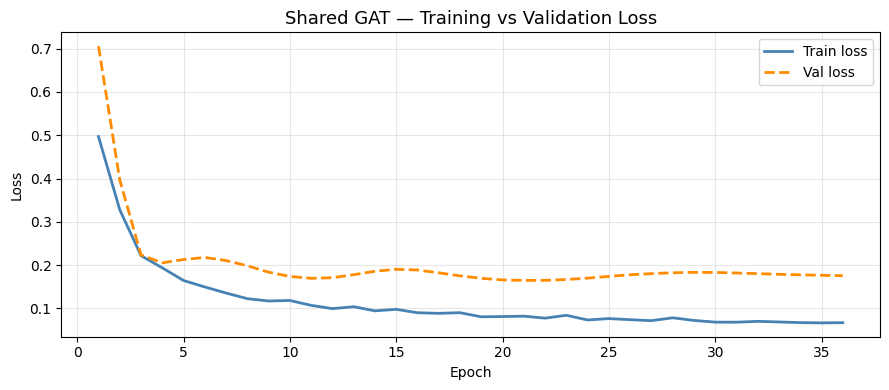

✅ Final Train loss: 0.0669 | Val loss: 0.1754
   Grade 0 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   4 | BG:  89 | Uncertain:  43 | Total:136


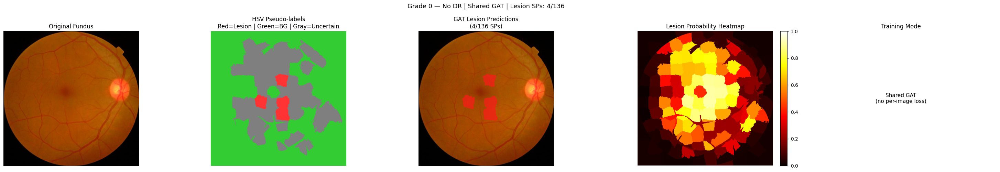

   Grade 1 | HA_thresh=0.2200 EX_thresh=0.2500
   Pseudo → Lesion:   5 | BG:  87 | Uncertain:  43 | Total:135


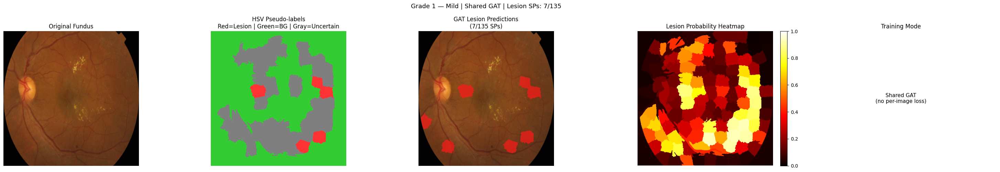

   Grade 2 | HA_thresh=0.2383 EX_thresh=0.2500
   Pseudo → Lesion:  20 | BG:  66 | Uncertain:  48 | Total:134


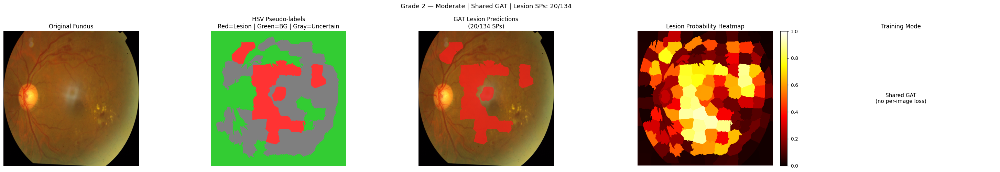

   Grade 3 | HA_thresh=0.2629 EX_thresh=0.2500
   Pseudo → Lesion:  18 | BG:  74 | Uncertain:  45 | Total:137


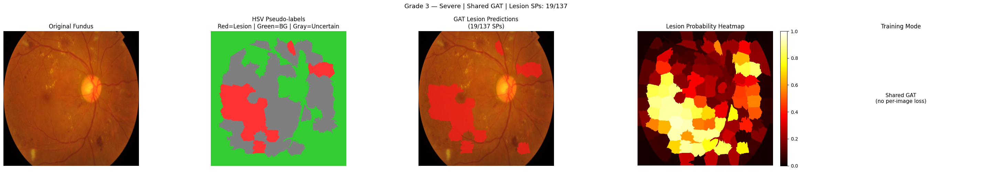

   Grade 4 | HA_thresh=0.3863 EX_thresh=0.2500
   Pseudo → Lesion:  26 | BG:  58 | Uncertain:  53 | Total:137


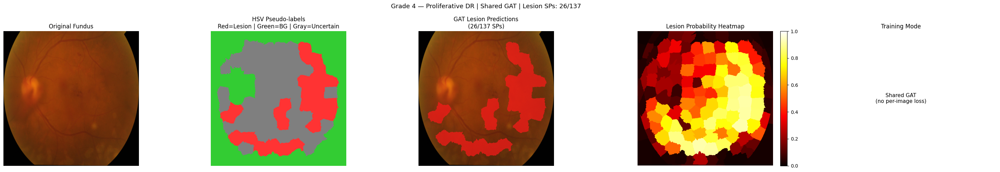


📊 Results Summary:
 grade       grade_name  n_sp  lesion_sp  lesion_pct
     0            No DR   136          4        2.94
     1             Mild   135          7        5.19
     2         Moderate   134         20       14.93
     3           Severe   137         19       13.87
     4 Proliferative DR   137         26       18.98


In [ ]:
# REPLACE the results_summary loop with:

# Sample 10 images per grade for training (50 total)
train_rows = []
for grade in range(5):
    grade_df = df[df["diagnosis"] == grade]
    n_grade = 30 if grade == 0 else 20   # more Grade 0 to teach "healthy retina"
    train_rows.append(grade_df.iloc[2:2+n_grade])
train_df = pd.concat(train_rows).reset_index(drop=True)

print("Building dataset for shared GAT training...")
graphs = build_dataset(train_df)
print(f"✅ {len(graphs)} graphs built")

# REPLACE WITH:
print("Training shared GAT...")
shared_model, sh_train_losses, sh_val_losses = train_shared_gat(
    graphs, device=DEVICE, epochs=60
)
shared_model.eval()

# ── Plot shared training loss curve ──────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(range(1, len(sh_train_losses)+1), sh_train_losses,
        color="steelblue", lw=2, label="Train loss")
ax.plot(range(1, len(sh_val_losses)+1),   sh_val_losses,
        color="darkorange", lw=2, linestyle="--", label="Val loss")
ax.set_title("Shared GAT — Training vs Validation Loss", fontsize=13)
ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
ax.legend(fontsize=10); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()
print(f"✅ Final Train loss: {sh_train_losses[-1]:.4f} | Val loss: {sh_val_losses[-1]:.4f}")

# Now evaluate on one image per grade using the shared model
results_summary = []
for grade in range(5):
    row  = df[df["diagnosis"] == grade].iloc[1]
    path = row["img_path"]

    enh, orig   = load_and_enhance(path)
    segs, n_sp  = generate_superpixels(enh)
    feats, cents = extract_superpixel_features(orig, enh, segs, n_sp)
    graph_cpu   = build_knn_graph(feats, cents, K_NEIGHBOURS)
    graph_gpu   = graph_cpu.to(DEVICE)

    pseudo, _   = generate_pseudo_labels(orig, enh, segs, n_sp, dr_grade=grade)
    pseudo_prop = pseudo.clone()   # no propagation — keep only confident pseudo-labels

    with torch.no_grad():
        # Re-normalize features per image at inference to reduce domain shift
        x_inf = graph_gpu.x.clone()
        x_inf = (x_inf - x_inf.mean(dim=0)) / (x_inf.std(dim=0) + 1e-8)
        logits = shared_model(x_inf, graph_gpu.edge_index, graph_gpu.edge_attr)
        probs  = F.softmax(logits, dim=1)[:, 1].cpu().numpy()

    from skimage.filters import threshold_otsu
    thresh = max(threshold_otsu(probs), 0.55) if probs.max() > probs.min() else 0.60
    preds  = (probs > thresh).astype(np.int64)

    # Mask out superpixels that were labeled uncertain in pseudo-labels
    # These are structurally ambiguous and shouldn't be predicted as lesion
    uncertain_mask = (pseudo_prop.numpy() == -1)
    preds[uncertain_mask] = 0

    lesion_pct = 100.0 * preds.sum() / max(n_sp, 1)
    results_summary.append({
        "grade": grade, "grade_name": GRADE_LABELS[grade],
        "n_sp": n_sp, "lesion_sp": int(preds.sum()),
        "lesion_pct": round(lesion_pct, 2),
    })

    visualize_results(orig, segs, preds, probs, None, None,
                  pseudo_labels=pseudo_prop,
                  title=f"Grade {grade} — {GRADE_LABELS[grade]} | Shared GAT | Lesion SPs: {int(preds.sum())}/{n_sp}")

results_df = pd.DataFrame(results_summary)
print("\n📊 Results Summary:")
print(results_df.to_string(index=False))